## <div align="center">   🏅 Olympics Medal Analysis 🏅 </div>
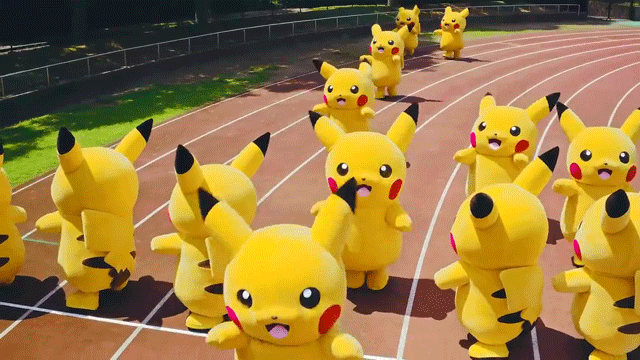 

### Done by:
   * Leah Ngan Lai
### Analysis Contents:
* 3.1. Import data and data overview
* 3.2. 🏅🏅🏅 Gold Medals by countries 
        - 3.2.1. Before 21st Century: 1986-2000
        - 3.2.2. In 21st Century: 1986-2014
* 3.3. 🏅🏅🏅 Popular Sport 
* 3.4. 🏅🏅🏅 Gold Medals by USA
        - 3.4.1. Before 21st Century: 1986-2000
        - 3.4.2. In 21st Century: 1986-2014

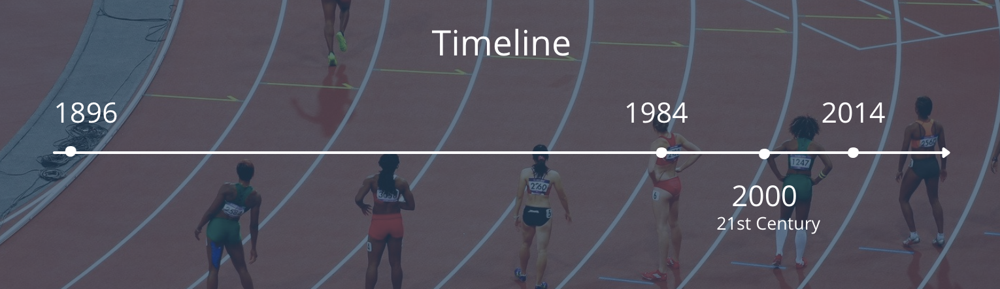

In [1]:
#import package
import numpy as np # linear algebra
import pandas as pd # data processing
import matplotlib
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
# import plotly.offline as py
# py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools
import plotly.tools as tls

from numpy import array
from matplotlib import cm

import warnings
warnings.filterwarnings('ignore')

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## <div align="center">   🏅 3.1. First, we need to import our data 🏅 </div>

##### 3.1.1. First, we need to import our data (*)

(*) This dataset includes Winter and Summer Olympics

In [52]:
#import data provided
olympics = pd.read_csv('olympic_medals.csv') 
#reading in the dataframe
olympics.head()
olympics.tail()
#checking first & last rows to make sure dataframe are read correctly

,Games,Year,City,Sport,Discipline,Athlete,Gender,Event,Medal,Country,Country Code,Population,GDP per Capita
0,Summer,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",Men,100M Freestyle,Gold,Hungary,HUN,9844686.0,12363.543460
1,Summer,1896,Athens,Gymnastics,Artistic G.,"LOUNDRAS, Dimitrios",Men,"Team, Parallel Bars",Bronze,Greece,GRE,10823732.0,18002.230578
2,Summer,1896,Athens,Gymnastics,Artistic G.,"MITROPOULOS, Ioannis",Men,"Team, Parallel Bars",Bronze,Greece,GRE,10823732.0,18002.230578
3,Summer,1896,Athens,Gymnastics,Artistic G.,"BÖCKER, Konrad",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995
4,Summer,1896,Athens,Gymnastics,Artistic G.,"FLATOW, Alfred",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995


,Games,Year,City,Sport,Discipline,Athlete,Gender,Event,Medal,Country,Country Code,Population,GDP per Capita
36930,Winter,2014,Sochi,Ice Hockey,Ice Hockey,"LACASSE, Genevieve",Women,Ice Hockey,Gold,Canada,CAN,35851774.0,43248.529909
36931,Winter,2014,Sochi,Ice Hockey,Ice Hockey,"LAROCQUE, Jocelyne",Women,Ice Hockey,Gold,Canada,CAN,35851774.0,43248.529909
36932,Winter,2014,Sochi,Ice Hockey,Ice Hockey,"MIKKELSON, Meaghan",Women,Ice Hockey,Gold,Canada,CAN,35851774.0,43248.529909
36933,Winter,2014,Sochi,Ice Hockey,Ice Hockey,"HEFFORD, Jayna",Women,Ice Hockey,Gold,Canada,CAN,35851774.0,43248.529909
36934,Winter,2014,Sochi,Skiing,Snowboard,"TRESPEUCH, Chloe",Women,Snowboard Cross,Bronze,France,FRA,66808385.0,36205.568102


   ##### 3.1.2. Data overview

It is always good to run some general summary data info.

In [4]:
#data overview
olympics.shape
olympics.columns
olympics.info()

(36935, 13)

Index(['Games', 'Year', 'City', 'Sport', 'Discipline', 'Athlete', 'Gender',
       'Event', 'Medal', 'Country', 'Country Code', 'Population',
       'GDP per Capita'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36935 entries, 0 to 36934
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Games           36935 non-null  object 
 1   Year            36935 non-null  int64  
 2   City            36935 non-null  object 
 3   Sport           36935 non-null  object 
 4   Discipline      36935 non-null  object 
 5   Athlete         36935 non-null  object 
 6   Gender          36935 non-null  object 
 7   Event           36935 non-null  object 
 8   Medal           36935 non-null  object 
 9   Country         30568 non-null  object 
 10  Country Code    30568 non-null  object 
 11  Population      30522 non-null  float64
 12  GDP per Capita  29957 non-null  float64
dtypes: float64(2), int64(1), object(10)
memory usage: 3.7+ MB


----

## <div align="center">   3.2. Next, explore 🏅🏅🏅 Gold Medals by Country 1986-2014 🌎 </div>

In [5]:
#Create a new table and only choose Gold Medal
goldMedals = olympics[(olympics.Medal == 'Gold')]
goldMedals.head()

,Games,Year,City,Sport,Discipline,Athlete,Gender,Event,Medal,Country,Country Code,Population,GDP per Capita
0,Summer,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",Men,100M Freestyle,Gold,Hungary,HUN,9844686.0,12363.543460
3,Summer,1896,Athens,Gymnastics,Artistic G.,"BÖCKER, Konrad",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995
4,Summer,1896,Athens,Gymnastics,Artistic G.,"FLATOW, Alfred",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995
5,Summer,1896,Athens,Gymnastics,Artistic G.,"FLATOW, Gustav Felix",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995
6,Summer,1896,Athens,Gymnastics,Artistic G.,"HILMAR, Georg",Men,"Team, Parallel Bars",Gold,Germany,GER,81413145.0,41313.313995


   ### 3.2.1. Before 21st Century 
   #### Gold Medal by country analysis from 1986-2000 🏅🏅🏅

In [88]:
df_medals_before2000 = goldMedals.loc[olympics['Year'] < 2000]
df_medals_from1986to2000 = df_medals_before2000.loc[df_medals_before2000['Year'] > 1986]

df_medals = df_medals_from1986to2000.loc[df_medals_from1986to2000['Medal']=='Gold']

#count the medal
cnt_srs = df_medals['Country'].value_counts().head(20) #only choose top 20

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color="green",
        #colorscale = 'blue',
        reversescale = True
    ),
)

layout = go.Layout(
    title='🏅🏅🏅 - Top 20 countries with Gold Medals 1896-2000'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="medal")  

📌📌📌 As we can see, the USA has the highest number of gold medals in this period. This might be due to the following reasons; 
* The USA participated in the highest number of sports in both Olympics - Summer and Winter. 
* The US had a strong athlete development system that helped the country always won the most medals in any Olympics.

   ### 3.2.2. In 21st Century 
   #### Gold Medal by country analysis from 2000-2014 🏅🏅🏅

In [89]:
df_medals = goldMedals.loc[olympics['Year'] > 2000]

#count the medal
cnt_srs = df_medals['Country'].value_counts().head(20)

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color="darkgreen",
        #colorscale = 'Blues',
        reversescale = True
    ),
)

layout = go.Layout(
    title='🏅🏅🏅 - Top 20 countries with Gold Medals 2000-2014'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="medal")  

📌📌📌 It is clear the United States has won far and away the most. However, in the last 14 years (with this data set), China and Canada have played really well and also presented in the TOP 5.
* China was the second strongest nation in the Summer Olympics for all of the last 14 year-seasons
* Canada emerged in Winter Olympics because of having one of the strongest winter sports facilities in the world 

---------

## <div align="center">   3.3. Then, now explore the Most Popular Sport 🏊🏃🏀  </div>
!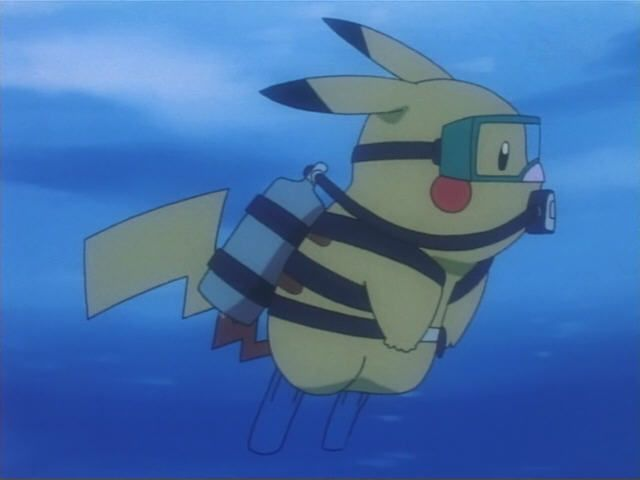

   ### Sport popular from 1986-2014  🏊🏃🏀

In [106]:
sport_popular = olympics.loc[olympics['Year'] > 2000]
cnt_srs = sport_popular['Sport'].value_counts() #count the sport participation 

#Viz bar chart
trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color=cnt_srs.values,
         colorscale = 'Picnic',
        reversescale = True
    ),
)

layout = go.Layout(
    title='Most Popular Sport 1986-2014🏊🏃🏀'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="sport")

##### 📌📌📌 Aquatics and Skiing are the largest sports of the game because of having the most number of different sports in one discipline. 
###### For example:
   * In Aquatics, Swimming includes 50 metre freestyle, 50 metre Butterfly, 4 × 100 metre freestyle relay, etc.
   * In Skiing, Skiing includes Skiing Jumping, Skiing freestyle, etc.
* From this, we could say that these sports also having the most participants

## <div align="center"> 3.4. 🏅🏅 Gold medals for the USA </div> 

In [71]:
#create a filter
is_USA =  goldMedals['Country']=='United States'
goldMedals_USA = goldMedals[is_USA]

goldMedals_USA

,Games,Year,City,Sport,Discipline,Athlete,Gender,Event,Medal,Country,Country Code,Population,GDP per Capita
60,Summer,1896,Athens,Shooting,Shooting,"PAINE, John",Men,25M Army Pistol,Gold,United States,USA,321418820.0,56115.718426
66,Summer,1896,Athens,Shooting,Shooting,"PAINE, Sumner",Men,50M Pistol (60 Shots),Gold,United States,USA,321418820.0,56115.718426
78,Summer,1896,Athens,Athletics,Athletics,"BURKE, Thomas",Men,400M,Gold,United States,USA,321418820.0,56115.718426
84,Summer,1896,Athens,Athletics,Athletics,"GARRETT, Robert",Men,Discus Throw,Gold,United States,USA,321418820.0,56115.718426
86,Summer,1896,Athens,Athletics,Athletics,"CLARK, Ellery",Men,High Jump,Gold,United States,USA,321418820.0,56115.718426
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36526,Winter,2014,Sochi,Skiing,Snowboard,"ANDERSON, Jamie",Women,Slopestyle,Gold,United States,USA,321418820.0,56115.718426
36531,Winter,2014,Sochi,Skiing,Snowboard,"KOTSENBURG, Sage",Men,Slopestyle,Gold,United States,USA,321418820.0,56115.718426
36597,Winter,2014,Sochi,Skiing,Freestyle Skiing,"WISE, David",Men,Ski Halfpipe,Gold,United States,USA,321418820.0,56115.718426
36598,Winter,2014,Sochi,Skiing,Freestyle Skiing,"CHRISTENSEN, Joss",Men,Ski Slopestyle,Gold,United States,USA,321418820.0,56115.718426


### 3.5.1. Before 21st Century
#### TOP 20 Sports won gold medals - USA - From 1986 to 2000🏅🏅🏅

In [93]:
#Choose the year from 1986-2000 
goldMedals_USA_before2000 = goldMedals_USA.loc[goldMedals_USA['Year'] < 2000]
goldMedals_USA_from1986to2000 = goldMedals_USA_before2000[goldMedals_USA['Year'] > 1986]
#index for the outcome with number of gold medals top 20
goldMedals_USA_from1986to2000_index = goldMedals_USA_from1986to2000.Discipline.value_counts().reset_index(name='Medal 🇺🇸').head(20)
goldMedals_USA_from1986to2000_index

,index,Medal 🇺🇸
0,Swimming,99
1,Athletics,69
2,Basketball,48
3,Ice Hockey,20
4,Football,16
5,Softball,15
6,Synchronized S.,13
7,Volleyball,12
8,Tennis,11
9,Artistic G.,9


In [94]:
#count the Gold medals from 1986-2000
goldMedals_USA_from1986to2000=goldMedals_USA_from1986to2000.loc[goldMedals_USA_from1986to2000['Medal']=='Gold']

cnt_srs = goldMedals_USA_from1986to2000['Discipline'].value_counts().head(20)

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color="darkblue",
        #colorscale = 'Blues',
        reversescale = True
    ),
)

layout = go.Layout(
    title='🥇🥇🥇 Top 20 Sports with Gold Medals 1986-2000 🇺🇸'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="medal")  

### 3.5.2. In 21st Century
#### TOP 20 Sports won gold medals - USA - From 2000 to 2014🏅🏅🏅

In [102]:
#Calculate Gold medal after 2000
goldMedals_USA_after2000 = goldMedals_USA.loc[goldMedals_USA['Year'] > 2000]

goldMedals_USA_index_after2000 = goldMedals_USA_after2000.Discipline.value_counts().reset_index(name='Medal 🇺🇸').head(20)
goldMedals_USA_index_after2000

,index,Medal 🇺🇸
0,Swimming,102
1,Basketball,60
2,Football,52
3,Athletics,49
4,Rowing,27
5,Softball,15
6,Water Polo,13
7,Volleyball,12
8,Snowboard,10
9,Jumping,8


In [96]:
#bar chart for Gold medals USA Top 20 after 2000
goldMedals_USA_after2000=goldMedals_USA_after2000.loc[goldMedals_USA_after2000['Medal']=='Gold']

cnt_srs = goldMedals_USA_after2000['Discipline'].value_counts().head(20)

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color="darkblue",
        #colorscale = 'Blues',
        reversescale = True
    ),
)

layout = go.Layout(
    title='🥇🥇🥇 Top 20 Sports with Gold Medals 2000-2014 🇺🇸'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="medal")  

#### 📌📌📌 First, interesting to see the number of gold medals of Athletics is decreasing in the last 14 years (2000- 2014). 
* It could be because the stronger competition from other countries such as Jamaica, United Kindom, and other African countries

#### 📌📌📌 Second, Football is moving really fast in the last 14 years. 
It could be because of the evolution of NFL Players: 
* Most players are bigger and stronger — particularly offensive and defensive linemen, whose size and weight surpass the average man's. 
* Players are more specialized by position, with physical attributes and customized training rituals unique to their roles.

---------

## 🥇Fun question: WHO won the most olympic medals in the history of the olympics ? 🥇
##### Hint: both of the USA and worldwide

## 🥇🥇🥇Option: 
* A. Jenny Thompson
* B. Carl Lewis
* C. Michael Phelps
* D. Mark Spitz
* E. Matthew Biondi

In [107]:
goldMedals_Athlete_USA_index = goldMedals_USA.Athlete.value_counts().reset_index(name='Medal').head(20)
goldMedals_Athlete_USA_index.head()

,index,Medal
0,"PHELPS, Michael",18
1,"LEWIS, Carl",9
2,"SPITZ, Mark",9
3,"BIONDI, Matthew",8
4,"THOMPSON, Jenny",8


🥇🥈🥉
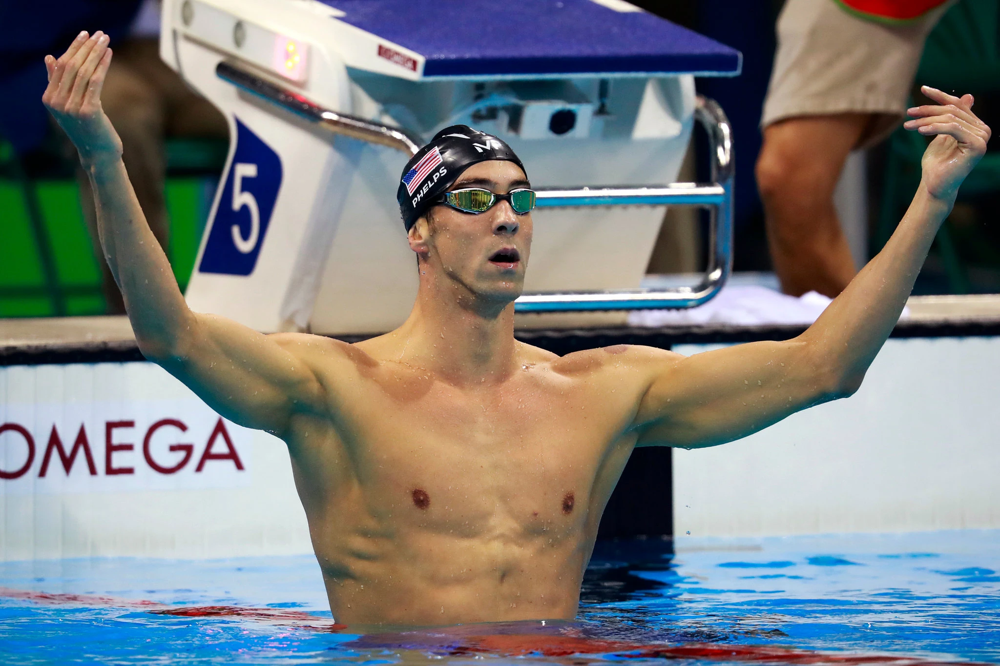